In [9]:
from scipy.ndimage import gaussian_filter
from scipy.signal import butter, sosfiltfilt
import numpy as np
import matplotlib.pyplot as plt
import math
from matplotlib.widgets import Slider
from matplotlib.colors import TwoSlopeNorm
from scipy.interpolate import PchipInterpolator

In [ ]:
def analytic_signal_fft_nd(x, axis=-1):
    """
    FFT-based Hilbert transform to get analytic signal along a given axis.
    Works for real x with arbitrary extra dims.
    Returns complex analytic signal with same shape.
    """
    x = np.asarray(x)
    n = x.shape[axis]
    X = np.fft.fft(x, n=n, axis=axis)
    h = np.zeros(n, dtype=float)
    if n % 2 == 0:
        h[0] = 1.0
        h[n//2] = 1.0
        h[1:n//2] = 2.0
    else:
        h[0] = 1.0
        h[1:(n+1)//2] = 2.0
    # reshape h to broadcast along 'axis'
    shape = [1]*x.ndim
    shape[axis] = n
    H = h.reshape(shape)
    Z = np.fft.ifft(X * H, axis=axis)
    return Z

def bandpass(movie, Fs, lo=1.0, hi=40.0, order=8):
    """
    Zero-phase bandpass of 'movie' along time axis (axis=2).
    """
    nyq = 0.5 * Fs
    sos = butter(order, [lo/nyq, hi/nyq], btype='bandpass', output='sos')
    return sosfiltfilt(sos, movie, axis=2)

def rewrap(phi):
    return (phi + np.pi) % (2*np.pi) - np.pi

def inst_freq_from_phase(phi, Fs):
    dphi = np.diff(phi)
    dphi = (dphi + np.pi) % (2*np.pi) - np.pi
    ifreq = (dphi / (2*np.pi)) * Fs
    return np.concatenate([ifreq, [np.nan]])

def repair_phase_with_pchip(phi_wrapped, bad_mask):
    phi = np.unwrap(phi_wrapped)
    phi_interp = phi.copy()
    phi_interp[bad_mask] = np.nan
    valid = ~np.isnan(phi_interp)
    if valid.sum() >= 2:
        xs = np.flatnonzero(valid); ys = phi_interp[valid]
        pchip = PchipInterpolator(xs, ys, extrapolate=False)
        phi_interp[~valid] = pchip(np.flatnonzero(~valid))
    return rewrap(phi_interp)

# --------- Analytic signal → amplitude & phase ----------
def phase_amp(movie_bp):
    """
    Compute analytic signal per pixel along time axis:
      z = x + i * Hilbert(x)
      amp = |z|
      phi = angle(z) in (-π, π]
    """
    z = analytic_signal_fft_nd(movie_bp, axis=2)
    amp = np.abs(z)
    phi = np.angle(z)
    return amp, phi

def smooth_phase_gaussian(z, amp=None, sigma_px=1.5, truncate=3.0, mode='reflect'):
    """
    Wrap-safe spatial smoothing of phase using the complex field.

    Parameters
    ----------
    z : complex array, shape (ny, nx, nt)
        Analytic signal. (From your FFT-Hilbert.)
    amp : float array, same shape as |z| (optional)
        If provided, we remove amplitude to avoid bias (recommended).
    sigma_px : float
        Spatial Gaussian sigma in pixels (gentle: 1.0–2.0 typical).
    truncate, mode : as in scipy.ndimage.gaussian_filter.

    Returns
    -------
    phi_s : float array (ny, nx, nt)
        Wrapped, gently smoothed phase.
    z_s   : complex array (ny, nx, nt)
        Smoothed *unit* complex field used to derive phi_s.
    """
    # Use unit phasors to avoid amplitude bias during smoothing
    if amp is None:
        amp = np.abs(z)
    eps = 1e-12
    z_unit = z / (amp + eps)

    # Smooth only in space (y,x), not time (t)
    z_s = gaussian_filter(z_unit, sigma=(sigma_px, sigma_px, 0.0),
                          truncate=truncate, mode=mode)

    # Convert back to wrapped phase
    phi_s = np.angle(z_s)
    return phi_s, z_s

def phase_gradient_from_complex(z_like, dx=1.0, dy=1.0):
    """
    Compute wrap-safe spatial phase gradients using complex products.

    Idea (Muller): the phase difference between neighboring samples equals
        Δφ = angle( Z_neighbor * conj(Z_here) )
    so we never unwrap.

    Parameters
    ----------
    z_like : complex array, shape (ny, nx, nt)
        Complex field with phase we want the gradient of.
        (Use the smoothed unit field z_s from above for robustness.)
    dx, dy : float
        Pixel spacings in x and y (defaults = 1).

    Returns
    -------
    gx, gy : float arrays, shape (ny, nx, nt)
        Forward-difference estimates of ∂φ/∂x and ∂φ/∂y (radians per pixel).
        Edges (last col/row) are set to NaN.
    """
    ny, nx, nt = z_like.shape

    # x-gradient: compare (x+1,y) to (x,y)
    z_xp1 = np.roll(z_like, -1, axis=1)
    dphi_x = np.angle(z_xp1 * np.conj(z_like))  # φ(x+1)-φ(x)
    gx = dphi_x / dx
    gx[:, -1, :] = np.nan  # invalidate wraparound column

    # y-gradient: compare (x,y+1) to (x,y)
    z_yp1 = np.roll(z_like, -1, axis=0)
    dphi_y = np.angle(z_yp1 * np.conj(z_like))  # φ(y+1)-φ(y)
    gy = dphi_y / dy
    gy[-1, :, :] = np.nan  # invalidate wraparound row

    return -gx, -gy

def divergence(gx, gy, dx=1.0, dy=1.0):
    """
    Divergence of the phase-gradient field g = (gx, gy):
        div = d(gx)/dx + d(gy)/dy
    Uses centered finite differences on the interior; edges -> NaN.

    Parameters
    ----------
    gx, gy : float arrays, shape (ny, nx, nt)
        Phase gradient components (radians/pixel).
    dx, dy : float
        Pixel spacings in x and y.

    Returns
    -------
    div : float array, shape (ny, nx, nt)
        Divergence (radians/pixel^2).
    """
    # Centered differences via roll; we'll invalidate borders afterward
    d_gx_dx = (np.roll(gx, -1, axis=1) - np.roll(gx,  1, axis=1)) / (2.0 * dx)
    d_gy_dy = (np.roll(gy, -1, axis=0) - np.roll(gy,  1, axis=0)) / (2.0 * dy)
    div = d_gx_dx + d_gy_dy

    # Invalidate first/last rows/cols that used wrapped neighbors
    div[:,  0, :] = np.nan
    div[:, -1, :] = np.nan
    div[ 0, :, :] = np.nan
    div[-1, :, :] = np.nan
    return div

def curl2d(gx, gy, dx=1.0, dy=1.0):
    """
    2D curl (z-component) of vector field g=(gx, gy):
        curl_z = ∂gy/∂x - ∂gx/∂y
    Centered differences on interior; edges set to NaN.
    Inputs gx, gy are (ny, nx, nt).
    """
    dgy_dx = (np.roll(gy, -1, axis=1) - np.roll(gy, 1, axis=1)) / (2.0 * dx)
    dgx_dy = (np.roll(gx, -1, axis=0) - np.roll(gx, 1, axis=0)) / (2.0 * dy)
    curl = dgy_dx - dgx_dy
    curl[:,  0, :] = np.nan; curl[:, -1, :] = np.nan
    curl[ 0, :, :] = np.nan; curl[-1, :, :] = np.nan
    return curl

def mask_low_amp(z, amp, z_thresh=1.0):
    """
    Mask low-amplitude regions (relative to z-scored amplitude).
    Any voxel with z-scored amplitude < z_thresh is set to NaN in 'z'.
    
    Parameters
    ----------
    z        : complex array (ny, nx, nt)
        Analytic signal.
    amp      : float array, same shape
        Amplitude = |z|.
    z_thresh : float
        Threshold in z-scored amplitude units.
    
    Returns
    -------
    z_masked : complex array
        Copy of z where low-amp regions are set to NaN.
    mask     : boolean array (ny, nx, nt)
        True where kept, False where masked.
    """
    # Z-score amplitude across space at each time point
    mu = np.nanmedian(amp, axis=(0,1), keepdims=True)
    sigma = np.nanstd(amp, axis=(0,1), keepdims=True) + 1e-12
    amp_z = (amp - mu) / sigma

    mask = amp_z >= z_thresh
    z_masked = z.copy().astype(np.complex128)
    z_masked[~mask] = np.nan + 1j*np.nan
    return z_masked, mask

def generalized_phase_3d(phi, z, Fs, lo=1.0, hi=40.0, nwin=1):
    """
    Per-pixel generalized phase on a 3D signal.
    Runs the exact same 1D logic on each (x,y) time series.
    Expects phi and z shaped (nx, ny, nt), time on the last axis.
    """

    nx, ny, nt = phi.shape
    out = np.full((nx, ny, nt), np.nan, dtype=float)

    # ---- inner: EXACT 1D routine (unchanged logic) ----
    def _generalized_phase_1d(phi_1d, z_1d, Fs, lo=1.0, hi=40.0, nwin=1):
        # Ensure 1D contiguous views
        phi_1d = np.asarray(phi_1d).reshape(-1)
        z_1d   = np.asarray(z_1d).reshape(-1)

        # IF and rotation rectify
        ifreq = inst_freq_from_phase(phi_1d, Fs)
        if np.nanmean(ifreq) < 0:
            z_1d = np.abs(z_1d) * np.exp(1j * (-np.angle(z_1d)))
            phi_1d = np.angle(z_1d)
            ifreq = inst_freq_from_phase(phi_1d, Fs)

        # hard bad segments for GP repair (IF < 0 or > hi), extended
        bad = (ifreq < 0) | (ifreq > hi)
        if bad.size > 0:
            bad[0] = False
        n = bad.size
        extended = np.zeros_like(bad, dtype=bool)
        i = 0
        while i < n:
            if bad[i]:
                j = i
                while (j + 1) < n and bad[j + 1]:
                    j += 1
                run_len = (j - i + 1)
                start = max(0, i - run_len * nwin)
                end   = min(n - 1, j + run_len * nwin)
                extended[start:end + 1] = True
                i = j + 1
            else:
                i += 1
        bad_ext = extended

        # GP repair
        phi_nan = phi_1d.copy()
        phi_nan[bad_ext] = np.nan
        phi_gp = repair_phase_with_pchip(phi_1d, bad_ext)

        # Ensure a flat (nt,) array even if the repair returns (nt,1)
        return np.asarray(phi_gp).reshape(-1)

    # ---- iterate pixels ----
    for ix in range(nx):
        for iy in range(ny):
            phi_trace = phi[ix, iy, :]
            z_trace   = z[ix, iy, :]

            # keep all-NaN (or empty) traces as NaN
            if np.all(np.isnan(phi_trace)) or np.all(np.isnan(z_trace)):
                continue

            phi_gp = _generalized_phase_1d(phi_trace, z_trace, Fs, lo=lo, hi=hi, nwin=nwin)
            out[ix, iy, :] = phi_gp

    return out

# =========================================================
# Compute-only: returns a results dict (no plotting)
# =========================================================
def analyze_phase(
    movie, Fs,
    lo=1.0, hi=40.0, order=8,
    sigma_px=1.0, truncate=3.0, mode='reflect',
    dx=1.0, dy=1.0,
    amp_mask=False,
    bandpass=True,
    identify_source=True,
    gp=False
):
    """
    End-to-end analysis with the SAME methods as your current function:
      - Optional temporal bandpass (Butterworth, sosfiltfilt)
      - Analytic signal via analytic_signal_fft_nd
      - Amplitude & wrapped phase
      - Wrap-safe smoothing by normalizing to unit-magnitude complex, then Gaussian
      - Phase gradient via complex-product forward differences, sign-flipped (g = -∇φ)
      - Gradient magnitude
      - Divergence via centered differences (interior), borders NaN
      - Curl_z = ∂gy/∂x − ∂gx/∂y via centered differences (interior), borders NaN

    Parameters
    ----------
    movie : (ny, nx, nt) real array
    Fs    : sampling rate (Hz)
    lo, hi, order : temporal bandpass parameters
    sigma_px, truncate, mode : spatial Gaussian params for complex smoothing
    dx, dy : pixel size (x,y)
    amp_mask : bool, apply your mask_low_amp() to z and amp
    bandpass : bool, apply bandpass before analytic signal
    identify_source : bool, compute argmax of divergence per frame for convenience
    gp : bool, whether to compute generalized phase

    Returns
    -------
    results : dict with keys:
        't', 'movie_bp', 'z', 'amp', 'phi', 'z_s', 'phi_s',
        'gx', 'gy', 'grad_mag', 'div', 'curl', 'source'
    """
    ny, nx, nt = movie.shape
    t = np.arange(nt) / Fs

    # ---- 1) Bandpass in time (unchanged method) ----
    if bandpass:
        nyq = 0.5 * Fs
        sos = butter(order, [lo/nyq, hi/nyq], btype='bandpass', output='sos')
        movie_bp = sosfiltfilt(sos, movie, axis=2)
    else:
        movie_bp = movie

    # ---- 2) Analytic signal, amplitude, phase (unchanged) ----
    z = analytic_signal_fft_nd(movie_bp, axis=2)
    amp = np.abs(z)

    # ---- Optional low-amp mask (unchanged) ----
    if amp_mask:
        z, mask = mask_low_amp(z, amp, z_thresh=-0.5)
        amp = np.where(mask, amp, np.nan)

    phi = np.angle(z)
    if gp:
        phi = generalized_phase_3d(phi, z, Fs)

    # ---- 3) Wrap-safe smoothing in complex domain (unchanged) ----
    eps = 1e-12
    z_unit = z / (amp + eps)
    z_s = gaussian_filter(z_unit, sigma=(sigma_px, sigma_px, 0.0),
                          truncate=truncate, mode=mode)
    phi_s = np.angle(z_s)

    # ---- 4) Phase gradient via complex-product forward diffs (unchanged) ----
    # gx ~ angle( z(x+1,y) * conj(z(x,y)) ) / dx ; same for gy, then sign flip for g = -∇φ
    z_xp1 = np.roll(z_s, -1, axis=1)
    dphi_x = np.angle(z_xp1 * np.conj(z_s))
    gx = dphi_x / dx
    gx[:, -1, :] = np.nan  # invalidate forward edge

    z_yp1 = np.roll(z_s, -1, axis=0)
    dphi_y = np.angle(z_yp1 * np.conj(z_s))
    gy = dphi_y / dy
    gy[-1, :, :] = np.nan  # invalidate forward edge

    # Convention match: g = -∇φ
    gx, gy = -gx, -gy

    grad_mag = np.sqrt(gx**2 + gy**2)

    # avoid divide-by-zero
    eps = 1e-12
    gx_u = gx / (grad_mag + eps)
    gy_u = gy / (grad_mag + eps)


    # ---- 5) Divergence via centered diffs on unit vectors ----
    d_gx_dx = (np.roll(gx_u, -1, axis=1) - np.roll(gx_u,  1, axis=1)) / (2.0 * dx)
    d_gy_dy = (np.roll(gy_u, -1, axis=0) - np.roll(gy_u,  1, axis=0)) / (2.0 * dy)
    div = d_gx_dx + d_gy_dy

    # mask borders
    div[:,  0, :] = np.nan; div[:, -1, :] = np.nan
    div[ 0, :, :] = np.nan; div[-1, :, :] = np.nan

    # ---- 6) Curl_z via centered diffs ----
    # curl_z = ∂gy/∂x − ∂gx/∂y
    curl = curl2d(gx, gy, dx, dy)

    # ---- 7) Optional source (argmax divergence) per frame ----
    if identify_source:
        # store one (iy, ix) per frame in arrays; handy for plotting later
        src_iy = np.full(nt, np.nan)
        src_ix = np.full(nt, np.nan)
        for k in range(nt):
            d_k = div[:, :, k]
            if np.any(np.isfinite(d_k)):
                flat_idx = np.nanargmax(d_k)
                iy, ix = np.unravel_index(flat_idx, d_k.shape)
                src_iy[k] = iy
                src_ix[k] = ix
        source = (src_ix, src_iy)  # arrays over time
    else:
        source = (None, None)

    return {
        't': t,
        'movie_bp': movie_bp,
        'z': z,
        'amp': amp,
        'phi': phi,
        'z_s': z_s,
        'phi_s': phi_s,
        'gx': gx,
        'gy': gy,
        'grad_mag': grad_mag,
        'div': div,
        'curl': curl,
        'source': source,
        'params': {
            'Fs': Fs, 'lo': lo, 'hi': hi, 'order': order,
            'sigma_px': sigma_px, 'truncate': truncate, 'mode': mode,
            'dx': dx, 'dy': dy, 'bandpass': bandpass, 'amp_mask': amp_mask
        }
    }


# =========================================================
# 2) Plotter: flexible grid, pick any subset of panels
# =========================================================
def plot_phase_results(
    movie, results, frame=None, plots=None,
    quiver_step=4, quiver_scale=None,
    identify_source=False, title=None, smoothed=True
):
    """
    Plot any combination of panels in a single figure (<=4 columns per row).

    Parameters
    ----------
    movie : (ny, nx, nt) raw signal
    results : dict from analyze_phase(...)
    frame : int or None (defaults to middle frame)
    plots : list of strings from:
        'raw_signal', 'bandpassed_signal', 'amplitude', 'phase',
        'gradient_vectors', 'gradient_magnitude', 'divergence', 'curl'
    quiver_step, quiver_scale : for 'gradient_vectors'
    identify_source : bool, mark divergence argmax if available
    title : figure suptitle
    *vlim : optional scalar limits; if None, robust 98th percentile of |.| is used
    """
    if plots is None:
        plots = ['raw_signal', 'amplitude', 'gradient_vectors', 'divergence']
    elif plots == 'all':
        plots = ['raw_signal', 'bandpassed_signal', 'amplitude', 'phase', 'gradient_vectors', 'gradient_magnitude', 'divergence', 'curl']

    t = results['t']
    ny, nx, nt = movie.shape
    if frame is None:
        frame = nt // 2
    frame = int(np.clip(frame, 0, nt-1))

    # pull computed arrays
    movie_bp = results.get('movie_bp')
    amp       = results.get('amp')
    phi       = results.get('phi')
    phi_s     = results.get('phi_s')
    gx        = results.get('gx')
    gy        = results.get('gy')
    grad_mag  = results.get('grad_mag')
    div       = results.get('div')
    curl      = results.get('curl')
    source    = results.get('source', (None, None))
    src_ix_t, src_iy_t = source if source is not None else (None, None)

    # figure grid: <=4 columns, but special-case 6 → (2,3)
    n = len(plots)
    if n == 6:
        ncols, nrows = 3, 2
    else:
        ncols = min(4, n)
        nrows = int(math.ceil(n / ncols))

    fig, axs = plt.subplots(nrows, ncols, figsize=(5*ncols, 4.8*nrows), constrained_layout=True)

    # normalize axs into 2D array
    if nrows * ncols == 1:
        axs = np.array([[axs]])
    elif nrows == 1:
        axs = np.array([axs])
    elif ncols == 1:
        axs = np.array([[a] for a in axs])
        
    def place(panel_idx):
        r = panel_idx // ncols
        c = panel_idx % ncols
        return axs[r, c]

    # plotting loop
    idx = 0
    for name in plots:
        ax = place(idx)
        if name == 'raw_signal':
            im = ax.imshow(movie[:, :, frame], origin='upper', cmap='seismic', vmin=-0.04, vmax=0.04)
            ax.set_title(f'Raw Signal'); ax.set_xticks([]); ax.set_yticks([])
            plt.colorbar(im, ax=ax, fraction=0.046)

        elif name == 'bandpassed_signal':
            im = ax.imshow(movie_bp[:, :, frame], origin='upper', cmap='seismic')
            ax.set_title('Bandpassed'); ax.set_xticks([]); ax.set_yticks([])
            plt.colorbar(im, ax=ax, fraction=0.046)

        elif name == 'amplitude':
            im = ax.imshow(amp[:, :, frame], origin='upper', cmap='magma')
            ax.set_title('Amplitude'); ax.set_xticks([]); ax.set_yticks([])
            plt.colorbar(im, ax=ax, fraction=0.046)

        elif name == 'phase':
            im = ax.imshow(phi[:, :, frame], origin='upper', cmap='twilight')
            ax.set_title('Phase (wrapped)'); ax.set_xticks([]); ax.set_yticks([])
            plt.colorbar(im, ax=ax, fraction=0.046)

        elif name == 'gradient_vectors':
            ph = phi[:, :, frame]
            qx = gx[:, :, frame]
            qy = gy[:, :, frame]
            im = ax.imshow(ph, origin='upper', cmap='twilight')
            ax.set_title('Phase + gradient'); ax.set_xticks([]); ax.set_yticks([])
            plt.colorbar(im, ax=ax, fraction=0.046)

            ny_, nx_ = ph.shape
            Yg, Xg = np.mgrid[0:ny_:1, 0:nx_:1]
            # Subsample & normalize to unit vectors (keep NaNs masked)
            qx_sub = qx[::quiver_step, ::quiver_step]
            qy_sub = qy[::quiver_step, ::quiver_step]
            X_sub  = Xg[::quiver_step, ::quiver_step]
            Y_sub  = Yg[::quiver_step, ::quiver_step]
            mag = np.sqrt(qx_sub**2 + qy_sub**2)
            qx_unit = np.divide(qx_sub, mag, out=np.zeros_like(qx_sub), where=mag>0)
            qy_unit = np.divide(qy_sub, mag, out=np.zeros_like(qy_sub), where=mag>0)

            ax.quiver(X_sub, Y_sub, qx_unit, qy_unit,
                      angles='xy', scale_units='xy',
                      scale=(0.3 if quiver_scale is None else quiver_scale),
                      color='k', alpha=0.8)

        elif name == 'gradient_magnitude':
            G = grad_mag[:, :, frame]
            im = ax.imshow(G, origin='upper', cmap='inferno')
            ax.set_title(r'Gradient magnitude  $|\nabla \phi|$'); ax.set_xticks([]); ax.set_yticks([])
            plt.colorbar(im, ax=ax, fraction=0.046)

        elif name == 'divergence':
            D = div[:, :, frame]
            im = ax.imshow(D, origin='upper', cmap='viridis')
            ax.set_title('Divergence  $(\\nabla \\cdot \\mathbf{g})$'); ax.set_xticks([]); ax.set_yticks([])
            plt.colorbar(im, ax=ax, fraction=0.046)

            if identify_source and src_ix_t is not None and src_iy_t is not None:
                sx = src_ix_t[frame] if np.ndim(src_ix_t) else src_ix_t
                sy = src_iy_t[frame] if np.ndim(src_iy_t) else src_iy_t
                if np.isfinite(sx) and np.isfinite(sy):
                    ax.plot(sx, sy, marker='x', markersize=10, markeredgewidth=2.5,
                            color='k')
                    ax.plot(sx, sy, marker='x', markersize=10, markeredgewidth=1.2,
                            color='white')

        elif name == 'curl':
            C = curl[:, :, frame]
            im = ax.imshow(C, origin='upper', cmap='plasma')
            ax.set_title('Curl  $(\\partial g_y/\\partial x - \\partial g_x/\\partial y)$')
            ax.set_xticks([]); ax.set_yticks([])
            plt.colorbar(im, ax=ax, fraction=0.046)

        else:
            raise ValueError(f"Unknown plot name: {name}")

        idx += 1

    if title:
        fig.suptitle(f'{title} (at t={t[frame]:.3f}s)', fontsize=16)
    plt.show()

def plot_four_frames(movie, title=None, cmap='gray'):
    """
    Plot 4 representative frames from a movie (ny, nx, nt):
      - 10th frame
      - 10th-last frame
      - two evenly spaced middle frames

    Uses shared vmin/vmax so color scale is consistent.
    """
    ny, nx, nt = movie.shape
    frames = [9, nt//3, 2*nt//3, nt-10]  # 0-based indexing

    # consistent color scale across all
    vmin = np.min(movie[:, :, frames])
    vmax = np.max(movie[:, :, frames])

    fig, axs = plt.subplots(1, 4, figsize=(16, 4), constrained_layout=True)
    for ax, f in zip(axs, frames):
        im = ax.imshow(movie[:, :, f], origin='upper', cmap=cmap,
                       vmin=vmin, vmax=vmax)
        ax.set_title(f'Frame {f}'); ax.set_xticks([]); ax.set_yticks([])
    fig.colorbar(im, ax=axs, fraction=0.046, location='right')
    if title:
        fig.suptitle(title, fontsize=14)
    plt.show()

def plot_phase_results_slider(
    movie, results, plots=None,
    quiver_step=4, quiver_scale=None,
    identify_source=False, title=None, smoothed=True,
    robust_pct=98
):
    """
    Interactive slider version of plot_phase_results.

    Parameters
    ----------
    movie : (ny, nx, nt) raw signal
    results : dict from analyze_phase(...)
    plots : list or 'all' with entries from:
        'raw_signal', 'bandpassed_signal', 'amplitude', 'phase',
        'gradient_vectors', 'gradient_magnitude', 'divergence', 'curl'
    quiver_step, quiver_scale : for 'gradient_vectors'
    identify_source : bool, mark divergence argmax if available
    title : figure suptitle
    smoothed : use results['phi_s'] background for gradient_vectors if True
    robust_pct : percentile for symmetric/upper robust scaling (e.g., 98)
    """
    # Defaults
    if plots is None:
        plots = ['raw_signal', 'amplitude', 'gradient_vectors', 'divergence']
    elif plots == 'all':
        plots = ['raw_signal', 'bandpassed_signal', 'amplitude', 'phase',
                 'gradient_vectors', 'gradient_magnitude', 'divergence', 'curl']

    # Unpack
    t         = results['t']
    movie_bp  = results.get('movie_bp')
    amp       = results.get('amp')
    phi       = results.get('phi')
    phi_s     = results.get('phi_s', phi)
    gx        = results.get('gx')
    gy        = results.get('gy')
    grad_mag  = results.get('grad_mag')
    div       = results.get('div')
    curl      = results.get('curl')
    source    = results.get('source', (None, None))
    src_ix_t, src_iy_t = source if source is not None else (None, None)

    ny, nx, nt = movie.shape
    frame = 1

    # ------- Helpers to compute fixed color limits (robust) -------
    def robust_sym_limits(A, pct=98):
        # symmetric limits from robust percentile of absolute values
        m = np.nanpercentile(np.abs(A), pct)
        return (-m, m)

    def robust_hi_limits(A, pct=98):
        lo = np.nanpercentile(A, 100 - pct)
        hi = np.nanpercentile(A, pct)
        # ensure ascending & non-degenerate
        if not np.isfinite(lo): lo = np.nanmin(A)
        if not np.isfinite(hi): hi = np.nanmax(A)
        if lo == hi:
            eps = 1e-12
            lo -= eps; hi += eps
        return (lo, hi)

    # Precompute per-panel clims (fixed across time)
    clims = {}
    for name in plots:
        if name == 'raw_signal':
            clims[name] = robust_sym_limits(movie, robust_pct)
        elif name == 'bandpassed_signal' and movie_bp is not None:
            clims[name] = robust_sym_limits(movie_bp, robust_pct)
        elif name == 'amplitude' and amp is not None:
            clims[name] = robust_hi_limits(amp, robust_pct)
        elif name == 'phase' and phi is not None:
            # full wrapped range
            clims[name] = (-np.pi, np.pi)
        elif name == 'gradient_vectors':
            # background is phase (unsmoothed)
            base = phi
            if base is not None:
                clims[name] = (-np.pi, np.pi)
        elif name == 'gradient_magnitude' and grad_mag is not None:
            clims[name] = robust_hi_limits(grad_mag, robust_pct)
        elif name == 'divergence' and div is not None:
            clims[name] = robust_sym_limits(div, robust_pct)
        elif name == 'curl' and curl is not None:
            clims[name] = robust_sym_limits(curl, robust_pct)

    # ------- Figure grid: ≤4 cols (special-case 6→(2,3)) -------
    n = len(plots)
    if n == 6:
        ncols, nrows = 3, 2
    else:
        ncols = min(4, n)
        nrows = int(math.ceil(n / ncols))

    # Leave room at bottom for slider
    fig, axs = plt.subplots(nrows, ncols, figsize=(5*ncols, 4.8*nrows),
                            constrained_layout=False)
    plt.subplots_adjust(bottom=0.1)  # space for slider

    # Normalize axs into 2D array
    if nrows * ncols == 1:
        axs = np.array([[axs]])
    elif nrows == 1:
        axs = np.array([axs])
    elif ncols == 1:
        axs = np.array([[a] for a in axs])

    def place(idx):
        r = idx // ncols
        c = idx % ncols
        return axs[r, c]

    # ------- Create artists and colorbars once -------
    ims = {}        # name -> imshow artist
    quiv = None     # quiver artist (only one panel uses it)
    marks = {}      # overlay marks (e.g., source cross) per panel

    idx = 0
    for name in plots:
        ax = place(idx)
        ax.set_xticks([]); ax.set_yticks([])

        if name == 'raw_signal':
            vmin, vmax = clims[name]
            im = ax.imshow(movie[:, :, frame], origin='upper',
                           cmap='seismic', vmin=vmin, vmax=vmax)
            ax.set_title('Raw Signal')
            plt.colorbar(im, ax=ax, fraction=0.046)
            ims[name] = im

        elif name == 'bandpassed_signal':
            if movie_bp is None:
                ax.text(0.5, 0.5, 'No bandpassed signal', ha='center', va='center')
            else:
                vmin, vmax = clims[name]
                im = ax.imshow(movie_bp[:, :, frame], origin='upper',
                               cmap='seismic', vmin=vmin, vmax=vmax)
                ax.set_title('Bandpassed')
                plt.colorbar(im, ax=ax, fraction=0.046)
                ims[name] = im

        elif name == 'amplitude':
            if amp is None:
                ax.text(0.5, 0.5, 'No amplitude', ha='center', va='center')
            else:
                vmin, vmax = clims[name]
                im = ax.imshow(amp[:, :, frame], origin='upper',
                               cmap='magma', vmin=vmin, vmax=vmax)
                ax.set_title('Amplitude')
                plt.colorbar(im, ax=ax, fraction=0.046)
                ims[name] = im

        elif name == 'phase':
            if phi is None:
                ax.text(0.5, 0.5, 'No phase', ha='center', va='center')
            else:
                vmin, vmax = clims[name]
                im = ax.imshow(phi[:, :, frame], origin='upper',
                               cmap='twilight', vmin=vmin, vmax=vmax)
                ax.set_title('Phase (wrapped)')
                plt.colorbar(im, ax=ax, fraction=0.046)
                ims[name] = im

        elif name == 'gradient_vectors':
            base = phi 
            if base is None or gx is None or gy is None:
                ax.text(0.5, 0.5, 'No gradients', ha='center', va='center')
            else:
                vmin, vmax = clims[name]
                ph0 = base[:, :, frame]
                qx0 = gx[:, :, frame]
                qy0 = gy[:, :, frame]
                im = ax.imshow(ph0, origin='upper', cmap='twilight',
                               vmin=vmin, vmax=vmax) 
                ax.set_title('Phase + gradient')
                plt.colorbar(im, ax=ax, fraction=0.046)
                ims[name] = im

                # Quiver (unit vectors, subsampled)
                ny_, nx_ = ph0.shape
                Yg, Xg = np.mgrid[0:ny_:1, 0:nx_:1]
                qx_sub = qx0[::quiver_step, ::quiver_step]
                qy_sub = qy0[::quiver_step, ::quiver_step]
                X_sub  = Xg[::quiver_step, ::quiver_step]
                Y_sub  = Yg[::quiver_step, ::quiver_step]
                mag = np.sqrt(qx_sub**2 + qy_sub**2)
                qx_unit = np.divide(qx_sub, mag, out=np.zeros_like(qx_sub), where=mag>0)
                qy_unit = np.divide(qy_sub, mag, out=np.zeros_like(qy_sub), where=mag>0)

                qscale = (0.3 if quiver_scale is None else quiver_scale)
                quiv = ax.quiver(X_sub, Y_sub, qx_unit, qy_unit,
                                 angles='xy', scale_units='xy',
                                 scale=qscale, color='k', alpha=0.8)

        elif name == 'gradient_magnitude':
            if grad_mag is None:
                ax.text(0.5, 0.5, 'No grad mag', ha='center', va='center')
            else:
                vmin, vmax = clims[name]
                im = ax.imshow(grad_mag[:, :, frame], origin='upper',
                               cmap='inferno', vmin=vmin, vmax=vmax)
                ax.set_title(r'Gradient magnitude  $|\nabla \phi|$')
                plt.colorbar(im, ax=ax, fraction=0.046)
                ims[name] = im

        elif name == 'divergence':
            if div is None:
                ax.text(0.5, 0.5, 'No divergence', ha='center', va='center')
            else:
                vmin, vmax = clims[name]
                im = ax.imshow(div[:, :, frame], origin='upper',
                               cmap='viridis', vmin=vmin, vmax=vmax)
                ax.set_title('Divergence  $(\\nabla \\cdot \\mathbf{g})$')
                plt.colorbar(im, ax=ax, fraction=0.046)
                ims[name] = im

                if identify_source and (src_ix_t is not None) and (src_iy_t is not None):
                    # pre-create two "x" marks (black/white outline look)
                    sx = src_ix_t[frame] if np.ndim(src_ix_t) else src_ix_t
                    sy = src_iy_t[frame] if np.ndim(src_iy_t) else src_iy_t
                    if sx is not None and sy is not None and np.isfinite(sx) and np.isfinite(sy):
                        # white on top of black to create outline
                        h1, = ax.plot([sx], [sy], marker='x', markersize=10,
                                      markeredgewidth=2.5, color='k', linestyle='None')
                        h2, = ax.plot([sx], [sy], marker='x', markersize=10,
                                      markeredgewidth=1.2, color='w', linestyle='None')
                        marks['divergence'] = (h1, h2)
                    else:
                        marks['divergence'] = None

        elif name == 'curl':
            if curl is None:
                ax.text(0.5, 0.5, 'No curl', ha='center', va='center')
            else:
                vmin, vmax = clims[name]
                im = ax.imshow(curl[:, :, frame], origin='upper',
                               cmap='plasma', vmin=vmin, vmax=vmax)
                ax.set_title('Curl  $(\\partial g_y/\\partial x - \\partial g_x/\\partial y)$')
                plt.colorbar(im, ax=ax, fraction=0.046)
                ims[name] = im

        else:
            raise ValueError(f"Unknown plot name: {name}")

        idx += 1

    # Suptitle
    if title:
        st = fig.suptitle(f'{title} (t={t[frame]:.3f}s)', fontsize=16)
    else:
        st = fig.suptitle(f't={t[frame]:.3f}s', fontsize=14)

    # ------- Slider setup -------
    ax_slider = plt.axes([0.12, 0.03, 0.76, 0.03])  # [left, bottom, width, height]
    s_frame = Slider(ax_slider, 'Frame', 0, nt-1, valinit=frame, valfmt='%0.0f')

    # ------- Update function -------
    def update(val):
        k = int(np.clip(s_frame.val, 0, nt-1))

        # Update each image panel
        for name, im in ims.items():
            if name == 'raw_signal':
                im.set_data(movie[:, :, k])

            elif name == 'bandpassed_signal' and movie_bp is not None:
                im.set_data(movie_bp[:, :, k])

            elif name == 'amplitude' and amp is not None:
                im.set_data(amp[:, :, k])

            elif name == 'phase' and phi is not None:
                im.set_data(phi[:, :, k])

            elif name == 'gradient_vectors':
                base = phi
                if base is not None:
                    im.set_data(base[:, :, k])
                    # update quiver if present
                    if (gx is not None) and (gy is not None) and (quiv is not None):
                        qx0 = gx[:, :, k]
                        qy0 = gy[:, :, k]
                        qx_sub = qx0[::quiver_step, ::quiver_step]
                        qy_sub = qy0[::quiver_step, ::quiver_step]
                        mag = np.sqrt(qx_sub**2 + qy_sub**2)
                        qx_unit = np.divide(qx_sub, mag, out=np.zeros_like(qx_sub), where=mag>0)
                        qy_unit = np.divide(qy_sub, mag, out=np.zeros_like(qy_sub), where=mag>0)
                        quiv.set_UVC(qx_unit, qy_unit)

            elif name == 'gradient_magnitude' and grad_mag is not None:
                im.set_data(grad_mag[:, :, k])

            elif name == 'divergence' and div is not None:
                im.set_data(div[:, :, k])
                # Move source mark if enabled
                if identify_source and (src_ix_t is not None) and (src_iy_t is not None):
                    sx = src_ix_t[k] if np.ndim(src_ix_t) else src_ix_t
                    sy = src_iy_t[k] if np.ndim(src_iy_t) else src_iy_t
                    mh = marks.get('divergence', None)
                    if mh is not None:
                        h1, h2 = mh
                        if (sx is not None) and (sy is not None) and np.isfinite(sx) and np.isfinite(sy):
                            h1.set_data([sx], [sy])
                            h2.set_data([sx], [sy])
                        else:
                            h1.set_data([], [])
                            h2.set_data([], [])

            elif name == 'curl' and curl is not None:
                im.set_data(curl[:, :, k])

        # Update suptitle time
        if title:
            st.set_text(f'{title} (t={t[k]:.3f}s)')
        else:
            st.set_text(f't={t[k]:.3f}s')

        fig.canvas.draw_idle()

    s_frame.on_changed(update)
    plt.show()
    return fig, axs, s_frame

/var/folders/0k/yytc9ywn0k3_j19jtm2h_cr00000gn/T/ipykernel_2346/203729594.py:349: RuntimeWarning: invalid value encountered in divide
  z_unit = z / (amp + eps)


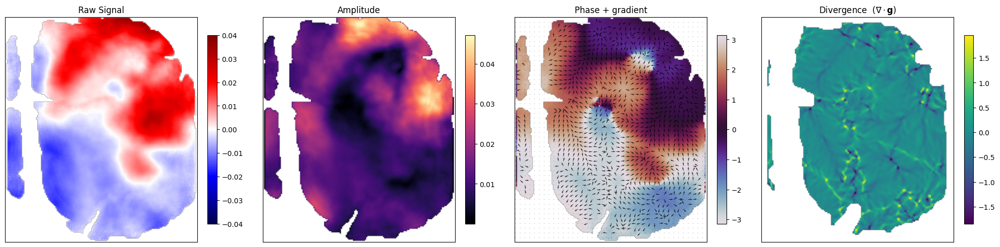

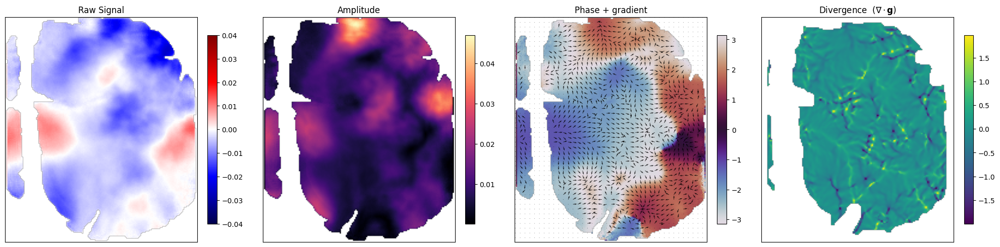

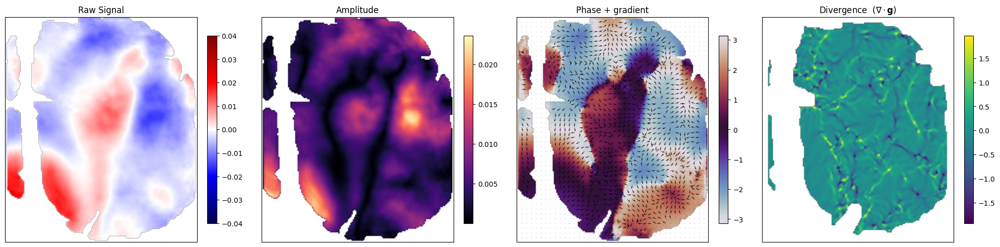

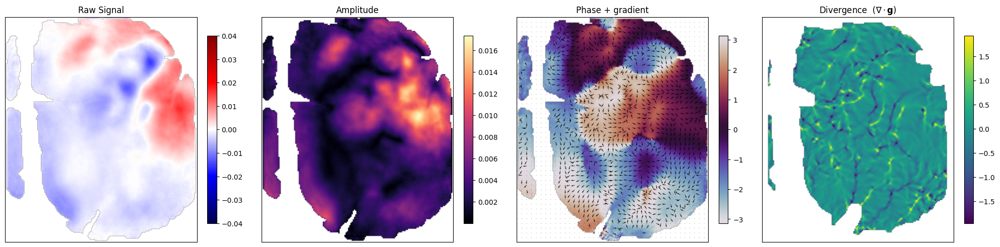

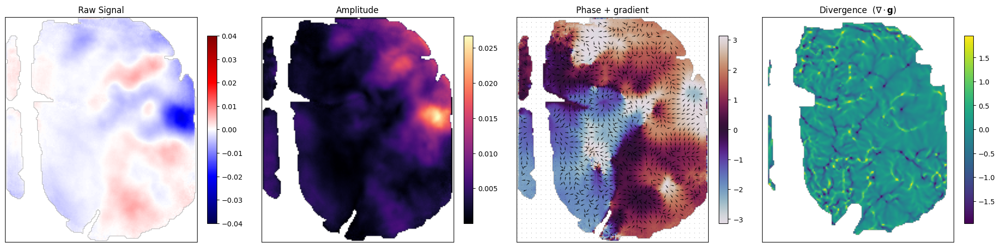

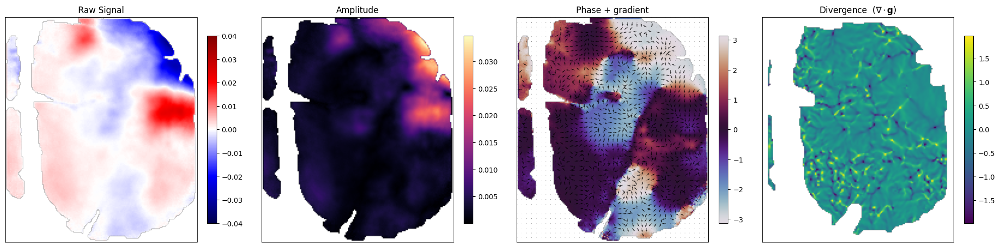

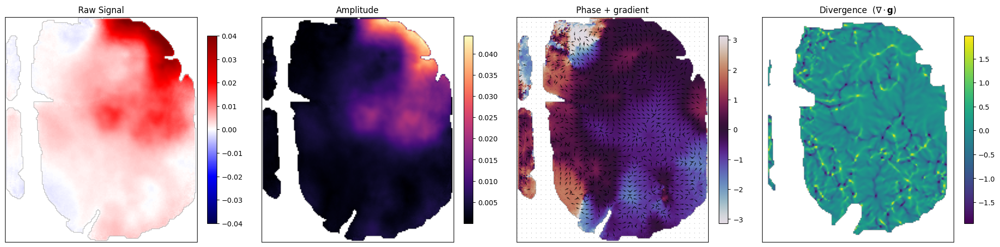

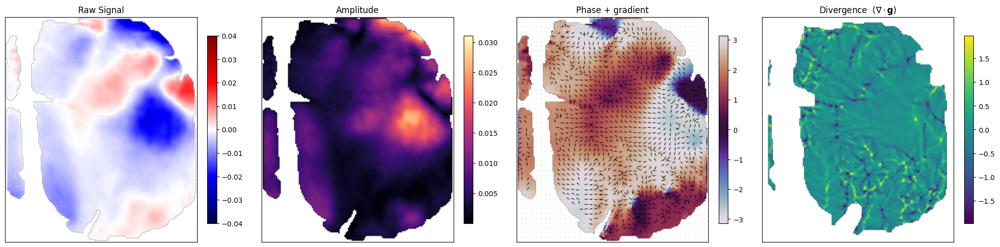

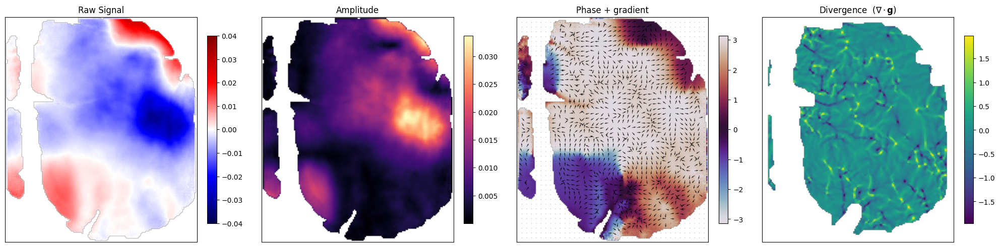

In [109]:
%matplotlib inline
plt.close('all')
movie = np.load('wave_clip_masked.npy')
movie = movie.transpose(2, 1, 0)
movie = np.rot90(movie, k=1, axes=(0, 1))
Fs = 157

results = analyze_phase(movie, Fs, lo=1, hi=40, bandpass=True, sigma_px=1.0, gp=False)

for i in np.arange(10, len(movie), 20):
    plot_phase_results(movie, results, frame=i, plots=['raw_signal', 'amplitude', 'gradient_vectors', 'divergence'])


/var/folders/0k/yytc9ywn0k3_j19jtm2h_cr00000gn/T/ipykernel_2346/203729594.py:349: RuntimeWarning: invalid value encountered in divide
  z_unit = z / (amp + eps)


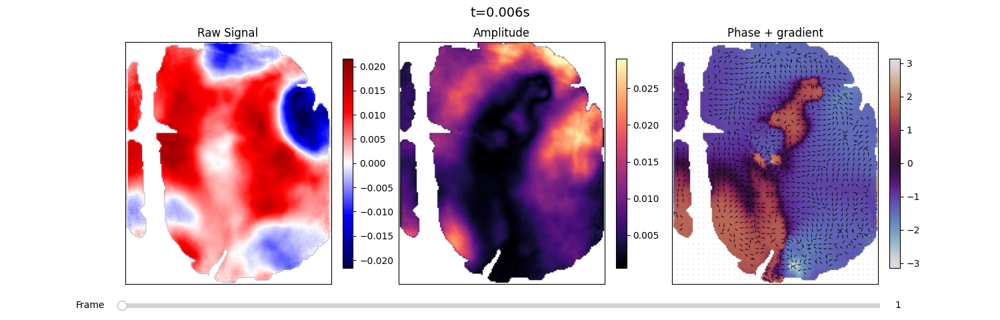

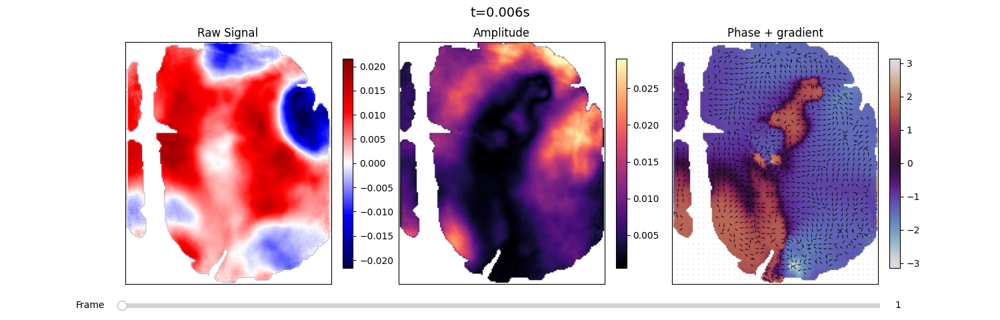

In [111]:
%matplotlib widget
results = analyze_phase(movie, Fs, lo=1, hi=40, bandpass=True, sigma_px=1.0)#, gp=True)
slider = plot_phase_results_slider(movie, results, plots=['raw_signal', 'amplitude', 'gradient_vectors'])

slider = plot_phase_results_slider(movie, results, plots=['raw_signal', 'amplitude', 'gradient_vectors'])

#results_gp = analyze_phase(movie, Fs, lo=1, hi=40, bandpass=True, sigma_px=1.0, gp=True)
#slider = plot_phase_results_slider(movie, results_gp)

In [86]:
phi = results['phi']
z = results['z']

In [93]:
nx, ny, nt = phi.shape
# sample a few pixels
ix, iy = nx//4, ny//4
ifreq = inst_freq_from_phase(phi[ix, iy], Fs)
print(np.nanmin(ifreq), np.nanmedian(ifreq), np.nanmax(ifreq))
print('frac>hi:', np.mean(ifreq > 40))

2.129471174003583 5.5317850847879875 27.726515825440753
frac>hi: 0.0


In [88]:
def _generalized_phase_1d(phi_1d, z_1d, Fs, lo=1.0, hi=40.0, nwin=2):
        # Ensure 1D contiguous views
        phi_1d = np.asarray(phi_1d).reshape(-1)
        z_1d   = np.asarray(z_1d).reshape(-1)

        # IF and rotation rectify
        ifreq = inst_freq_from_phase(phi_1d, Fs)
        if np.nanmean(ifreq) < 0:
            z_1d = np.abs(z_1d) * np.exp(1j * (-np.angle(z_1d)))
            phi_1d = np.angle(z_1d)
            ifreq = inst_freq_from_phase(phi_1d, Fs)

        # hard bad segments for GP repair (IF < 0 or > hi), extended
        bad = (ifreq < 0) | (ifreq > hi)
        if bad.size > 0:
            bad[0] = False
        n = bad.size
        extended = np.zeros_like(bad, dtype=bool)
        i = 0
        while i < n:
            if bad[i]:
                j = i
                while (j + 1) < n and bad[j + 1]:
                    j += 1
                run_len = (j - i + 1)
                start = max(0, i - run_len * nwin)
                end   = min(n - 1, j + run_len * nwin)
                extended[start:end + 1] = True
                i = j + 1
            else:
                i += 1
        bad_ext = extended

        # GP repair
        phi_nan = phi_1d.copy()
        phi_nan[bad_ext] = np.nan
        phi_gp = repair_phase_with_pchip(phi_1d, bad_ext)

        # Ensure a flat (nt,) array even if the repair returns (nt,1)
        return np.asarray(phi_gp).reshape(-1)

In [94]:
phi_gp = _generalized_phase_1d(phi[ix, iy], z, Fs)
phi_gp_1 = _generalized_phase_1d(phi[ix+1, iy+1], z, Fs)

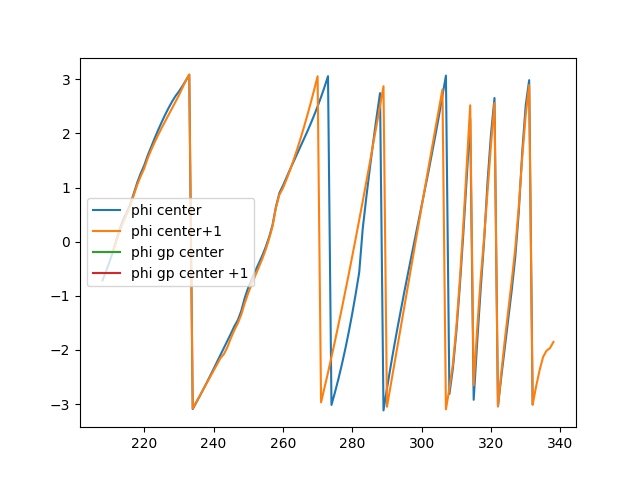

In [ ]:
plt.figure(figsize=(12,12))
plt.close('all')
plt.plot(phi[ix, iy], label='phi center')
plt.plot(phi[ix+1, iy+1], label='phi center+1')
plt.plot(phi_gp, label='phi gp center', ls='-')
plt.plot(phi_gp_1, label='phi gp center +1')
plt.legend()
plt.show()